# Urban Traffic Analysis with Machine Learning

**Project Overview**: Comprehensive analysis of urban traffic flow using the open source UTD19 Multi-City Traffic Detector loop Dataset from ETH Zurich using the machine learning methods.

**Dataset**: [UTD19 - ETH Zurich](https://utd19.ethz.ch/)

This project is divided into 13 tasks.

In [ ]:
'''Import of the neccessary packages. 
If the packages are not installed yet, uncomment the following lines'''


%pip install folium
%pip install earthpy


# Import necessary packages
import os 
import folium
from folium import plugins
import pandas as pd

Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.


The dataset consists of two main files. The first file creates a mapping of detector ID and the position of the detectors. This file is available as detectors_public.csv. Import this file as pandas df with the name detectors (1). Then filter the detector df in a way that it only contains the detectors of London (citycode == london) in the future (2).

In [ ]:
# Import pandas to work with DataFrames
import pandas as pd

# Step 1: Load the CSV file containing the positions of all detectors into a DataFrame
detectors = pd.read_csv("detectors_public.csv")

# Step 2: Display the first 10 rows to verify that the data was imported correctly
detectors.head(10)

# Step 3: Filter the DataFrame to keep only detectors with the city code 'london'
detectors = detectors[detectors["citycode"] == "london"]

# Step 4: Display the first 10 rows of the filtered London detectors
detectors.head(10)

,detid,length,pos,fclass,road,limit,citycode,lanes,linkid,long,lat
4856,EAST_N04/161x1,0.303585,0.261157,secondary,Homerton Road,NaN,london,1.0,5082.0,-0.021497,51.550929
4857,EAST_N04/161y1,0.103679,0.063417,primary,Eastway,NaN,london,1.0,5091.0,-0.020899,51.550704
4858,EAST_N04/162a1,0.260623,0.117906,secondary,Homerton Road,NaN,london,1.0,5083.0,-0.022649,51.550907
4859,EAST_N04/162a2,0.216874,0.117942,secondary,Homerton Road,NaN,london,1.0,5084.0,-0.022617,51.550880
4860,EAST_N04/163f1,0.344754,0.329789,primary,Eastway,NaN,london,1.0,5092.0,-0.019288,51.552281
4861,EAST_N04/237c2,0.441917,0.075087,primary,Eastway,NaN,london,1.0,3485.0,-0.023171,51.550043
4862,EAST_N04/237z1,0.092371,0.050818,primary,Eastway,NaN,london,1.0,5081.0,-0.021715,51.550716
4863,EAST_N04/161a1,0.063615,0.039030,secondary,Homerton Road,NaN,london,1.0,5086.0,-0.020662,51.551381
4864,EAST_N04/161z1,0.051048,0.034374,secondary,Homerton Road,NaN,london,1.0,5085.0,-0.020615,51.551381
4865,EAST_N04/161d1,0.071297,0.021352,secondary,Homerton Road,NaN,london,1.0,5088.0,-0.020755,51.551369


Following cell visualizes the position of the detectors in London

In [ ]:
# Create a map and center it on London (using a specific coordinate)
map_london = folium.Map(location=[51.550929, -0.021497])

# Add a marker (circle) to the map for each detector
for index, row in detectors.iterrows():
    folium.Circle(
        radius=0.5,                         # Radius of the circle (very small)
        location=[row['lat'], row['long']], # Detector position (latitude, longitude)
        popup=row['detid'],                 # Show detector ID as a popup
        color="crimson",                    # Border color (red)
        fill=True,                          # Fill the circle with color
    ).add_to(map_london)

# Display the map
map_london

There is a problem with the detector with detid == CNTR_N03/164a1 and it fails/is not available anymore. The following cell extracts this detector in a new df with the name detector_select

In [142]:
detector_select = detectors[detectors['detid'] == 'CNTR_N03/164a1']
detector_select

,detid,length,pos,fclass,road,limit,citycode,lanes,linkid,long,lat
6632,CNTR_N03/164a1,0.149576,0.13735,tertiary,Herbal Hill,NaN,london,1.0,3827.0,-0.107306,51.522419


Visualize this defective detector in the map by including a new folium.Circle with the position of the detector, the radius 3 and fill of blue. (3)

In [ ]:
import folium

# Step 1: Create a map with London as the initial center
map_london = folium.Map(location=[51.550929, -0.021497], zoom_start=11)

# Step 2: Plot all active London detectors as red circles
for index, row in detectors.iterrows():
    folium.Circle(
        radius=0.5,
        location=[row['lat'], row['long']],
        popup=row['detid'],
        color="crimson",
        fill=True,
    ).add_to(map_london)

# Step 3: Highlight the faulty detector separately in blue (with a larger radius)
for index, row in detector_select.iterrows():
    folium.Circle(
        radius=3,
        location=[row['lat'], row['long']],
        popup=row['detid'],
        color="blue",
        fill=True,
    ).add_to(map_london)

# Step 4: Display the map
map_london

The following cell searches for the 5 detectors that are closest to the defective detector.

In [ ]:
detector_distance = dict()
detectors_defect = ['CNTR_N03/164a1']

for index, row in detectors.iterrows():
    if row["detid"] not in detectors_defect:
        distance = (
            (row["long"] - detector_select['long'].values[0])**2 +
            (row["lat"] - detector_select['lat'].values[0])**2
        )**0.5
        detector_distance[row['detid']] = distance

# Convert to a DataFrame and sort by distance
detector_distance = pd.DataFrame(
    pd.Series(detector_distance)
).rename(columns={0: 'distance'})

detector_distance = detector_distance.sort_values(by='distance').head(5)

# Extract detector IDs
detector_list = list(detector_distance.index)
detector_list

['CNTR_N03/032y1',
 'CNTR_N03/149a1',
 'CNTR_N03/032z1',
 'NORT_N02/191b1',
 'CNTR_N03/032c1']

The data is now read into the pandas df data. Provide yourself with an overview of the data by printing the first 10 rows of data (4):

In [ ]:
# Loading can take some minutes
data = pd.read_csv('data_london.csv')

# Display the first 10 rows of the dataset
data.head(10)

,Unnamed: 0,day,interval,detid,flow,occ,error,city,speed
0,0,2015-05-16,0,EAST_N04/161x1,144.00000,0.028333,0.0,london,NaN
1,1,2015-05-16,300,EAST_N04/161x1,204.00000,0.040000,0.0,london,NaN
2,2,2015-05-16,600,EAST_N04/161x1,216.00000,0.039167,0.0,london,NaN
3,3,2015-05-16,900,EAST_N04/161x1,168.00000,0.029167,0.0,london,NaN
4,4,2015-05-16,1200,EAST_N04/161x1,144.00000,0.024167,0.0,london,NaN
5,5,2015-05-16,1500,EAST_N04/161x1,195.00000,0.037500,0.0,london,NaN
6,6,2015-05-16,1800,EAST_N04/161x1,121.89474,0.026930,0.0,london,NaN
7,7,2015-05-16,2100,EAST_N04/161x1,218.06896,0.042787,0.0,london,NaN
8,8,2015-05-16,2400,EAST_N04/161x1,228.40678,0.072556,0.0,london,NaN
9,9,2015-05-16,2700,EAST_N04/161x1,144.00000,0.028333,0.0,london,NaN


To get some more overview of the data the following cell creates mean values of the first 100 detectors. Alternatively you can also recall the data out of the csv file that I already created.

In [ ]:
mean_detectors_rows = []  # Temporary storage as a list

detectors_100 = detectors.head(100)

for index, row in detectors_100.iterrows():
    occ = data[data['detid'] == row['detid']]['occ'].mean()
    flow = data[data['detid'] == row['detid']]['flow'].mean()
    
    df_append = {'mean_occ': occ, 'mean_flow': flow}
    mean_detectors_rows.append(df_append)

# Convert the list into a DataFrame
mean_detectors = pd.DataFrame(mean_detectors_rows)

# Display the result
mean_detectors.head(10)

,mean_occ,mean_flow
0,0.049322,232.106322
1,0.047504,217.365195
2,0.041181,252.283085
3,0.021335,119.402822
4,0.081167,443.897719
5,0.978743,0.251231
6,0.978644,0.452085
7,0.034903,121.813086
8,0.018164,80.861871
9,0.155642,97.783866


In [148]:
#mean_detectors.to_csv('mean_detectors.csv')
mean_detectors = pd.read_csv('mean_detectors.csv')
mean_detectors.head(10)

,Unnamed: 0,mean_occ,mean_flow
0,0,0.049322,232.106322
1,1,0.047504,217.365195
2,2,0.041181,252.283085
3,3,0.021335,119.402822
4,4,0.081167,443.897719
5,5,0.978743,0.251231
6,6,0.978644,0.452085
7,7,0.034903,121.813086
8,8,0.018164,80.861871
9,9,0.155642,97.783866


Visualize mean_detectors in a Plotly scatter plot. In doing this mean_occ should be x-achsis and mean_flow should be y-achsis. (5)

In [ ]:
# Install Plotly if it is not already installed
%pip install plotly

import plotly.express as px

fig = px.scatter(
    mean_detectors,
    x='mean_occ',        # x-axis
    y='mean_flow',       # y-axis
    title='Mean Occupancy vs Mean Flow',
    labels={
        'mean_occ': 'Mean Occupancy',
        'mean_flow': 'Mean Flow'
    }
)

fig.show()

Note: you may need to restart the kernel to use updated packages.


In [ ]:
# Install scikit-learn if it is not already installed
%pip install scikit-learn

import matplotlib.pyplot as plt
from sklearn.datasets import make_blobs
from sklearn.cluster import KMeans

Note: you may need to restart the kernel to use updated packages.


Use KMeans.fit() of sklearn.cluster to create 7 clusters. Name the output kmeans to visualize the cluster in the next step. (6)

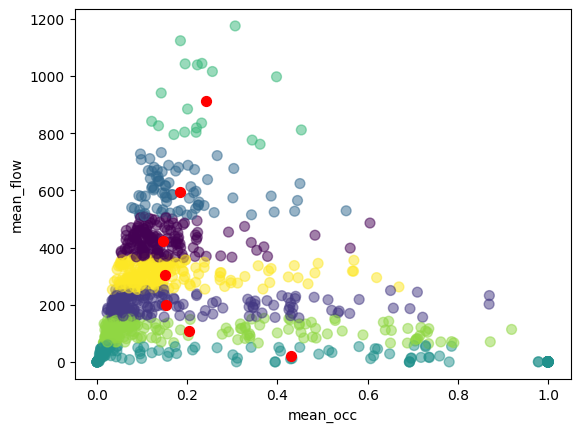

In [ ]:
# Input matrix X with the two features
X = mean_detectors[['mean_occ', 'mean_flow']]  # 2D matrix for KMeans

# Initialize and fit KMeans with 7 clusters
kmeans = KMeans(n_clusters=7, random_state=0)
kmeans.fit(X)

# Read out the cluster centers
centroids = kmeans.cluster_centers_

# Color points according to the assigned cluster
plt.scatter(
    mean_detectors['mean_occ'],
    mean_detectors['mean_flow'],
    c=kmeans.labels_.astype(float),
    s=50,
    alpha=0.5
)

# Plot the cluster centers as red points
plt.scatter(centroids[:, 0], centroids[:, 1], c='red', s=50)

plt.xlabel("mean_occ")
plt.ylabel("mean_flow")
plt.show()

The following cell creates the elbow plot that was discussed in the lecture. For what is this graph used (7) and which other method could be used for that (8):

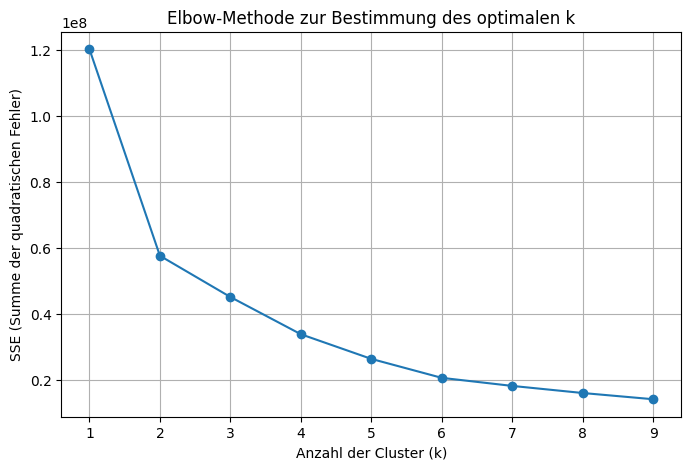

'\nAnother method to determine the optimal number of clusters is the Silhouette Score.\nIt measures how similar an object is to its own cluster compared to other clusters.\nThe score ranges from -1 to 1, where a higher score indicates better-defined clusters.\nThis method is especially helpful when the elbow plot doesn\'t show a clear "elbow".\n'

In [ ]:
# Dictionary to store SSE values (Sum of Squared Errors)
sse = {}

# Compute SSE for k = 1 to 9
for k in range(1, 10):
    kmeans = KMeans(n_clusters=k, random_state=0).fit(mean_detectors)
    sse[k] = kmeans.inertia_

# Create the elbow plot
plt.figure(figsize=(8, 5))
plt.plot(list(sse.keys()), list(sse.values()), marker='o')
plt.xlabel("Number of clusters (k)")
plt.ylabel("SSE (Sum of Squared Errors)")
plt.title("Elbow Method to Determine the Optimal k")
plt.grid(True)
plt.show()

# ==================== Task 7 & 8 ====================

# Task 7:
'''
The elbow plot is used to determine the optimal number of clusters (k) in the KMeans algorithm.
It shows how the Sum of Squared Errors (SSE) decreases as the number of clusters increases.
Initially, adding more clusters significantly reduces the SSE, but after a certain point,
the improvement becomes marginal. This point is called the "elbow" and represents a good
trade-off between clustering quality and model simplicity.
'''

# Task 8:
'''
Another method to determine the optimal number of clusters is the Silhouette Score.
It measures how similar a data point is to its own cluster compared to other clusters.
The score ranges from -1 to 1, where a higher score indicates better-defined clusters.
This method is especially useful when the elbow plot does not show a clear "elbow".
'''

The following cells create a dataset which contains the data of the defective detecotr as output and the data of the 5 closest detectors as input. With that data it is later possible to train a model that predicts the occ detector values of the defective detector.

In [153]:
data_london = data
data_london_defect = data_london[data['detid']=='CNTR_N03/164a1']
data_london_defect.reset_index(inplace = False) 

,index,Unnamed: 0,day,interval,detid,flow,occ,error,city,speed
0,10936698,10936698,2015-05-16,0,CNTR_N03/164a1,528.0,0.111667,0.0,london,NaN
1,10936699,10936699,2015-05-16,300,CNTR_N03/164a1,552.0,0.126667,0.0,london,NaN
2,10936700,10936700,2015-05-16,600,CNTR_N03/164a1,672.0,0.147500,0.0,london,NaN
3,10936701,10936701,2015-05-16,900,CNTR_N03/164a1,516.0,0.122500,0.0,london,NaN
4,10936702,10936702,2015-05-16,1200,CNTR_N03/164a1,504.0,0.110000,0.0,london,NaN
...,...,...,...,...,...,...,...,...,...,...
6435,10943133,10943133,2016-05-22,84900,CNTR_N03/164a1,324.0,0.074167,0.0,london,NaN
6436,10943134,10943134,2016-05-22,85200,CNTR_N03/164a1,216.0,0.035000,0.0,london,NaN
6437,10943135,10943135,2016-05-22,85500,CNTR_N03/164a1,144.0,0.031667,0.0,london,NaN
6438,10943136,10943136,2016-05-22,85800,CNTR_N03/164a1,300.0,0.075833,0.0,london,NaN


In [154]:
dataset = data_london[data_london.detid.isin(detector_list)].reset_index(inplace = False)
dataset

,index,Unnamed: 0,day,interval,detid,flow,occ,error,city,speed
0,2220254,2220254,2015-05-16,0,CNTR_N03/032c1,564.0,0.358333,0.0,london,NaN
1,2220255,2220255,2015-05-16,300,CNTR_N03/032c1,384.0,0.306667,0.0,london,NaN
2,2220256,2220256,2015-05-16,600,CNTR_N03/032c1,456.0,0.285833,0.0,london,NaN
3,2220257,2220257,2015-05-16,900,CNTR_N03/032c1,456.0,0.294167,0.0,london,NaN
4,2220258,2220258,2015-05-16,1200,CNTR_N03/032c1,408.0,0.392500,0.0,london,NaN
...,...,...,...,...,...,...,...,...,...,...
29646,23113772,23113772,2016-05-22,84900,NORT_N02/191b1,0.0,0.000000,1.0,london,NaN
29647,23113773,23113773,2016-05-22,85200,NORT_N02/191b1,0.0,0.000000,1.0,london,NaN
29648,23113774,23113774,2016-05-22,85500,NORT_N02/191b1,0.0,0.000000,1.0,london,NaN
29649,23113775,23113775,2016-05-22,85800,NORT_N02/191b1,0.0,0.000000,1.0,london,NaN


In [157]:
input_ = list()
output_ = list()
from statistics import mean
for index, row in data_london_defect.iterrows():
    input_item =list()
    for det_index, detector in enumerate(detector_list):
        current_filter = dataset[(dataset["day"]==row['day'])
                                 & (dataset["interval"] == row['interval'])
                                & (dataset["detid"] == detector)]
        #print(current_filter['flow'].tolist())
        if len(current_filter) == 1:
            input_item.append(current_filter['occ'].tolist()[0])
        else:
            input_item.append(0)
    #output_.append(row['occ'])
    output_.append(mean(input_item))
    input_.append(input_item)

In [159]:
#for i in range(10):
    #print(f'Input: {input_[i]} ; Output:{output_[i]}')
import numpy as np
s = pd.Series(input_)
df = pd.DataFrame(np.vstack(s), columns=['one', 'two', 'three', 'four', 'five'])
s_result = pd.Series(output_)
df_out = pd.DataFrame(np.vstack(s_result), columns=['result'])
print(df)
print(df_out)

           one       two     three  four      five
0     0.145833  0.221667  0.151667   0.0  0.358333
1     0.093333  0.334167  0.130000   0.0  0.306667
2     0.130833  0.175000  0.175000   0.0  0.285833
3     0.120833  0.250000  0.190833   0.0  0.294167
4     0.056667  0.225000  0.148333   0.0  0.392500
...        ...       ...       ...   ...       ...
6435  0.062500  0.276667  0.090833   0.0  0.060000
6436  0.065833  0.491667  0.376667   0.0  0.078333
6437  0.067500  0.502500  0.472500   0.0  0.068333
6438  0.039167  0.415000  0.420833   0.0  0.048333
6439  0.038333  0.077500  0.064167   0.0  0.054167

[6440 rows x 5 columns]
        result
0     0.175500
1     0.172833
2     0.153333
3     0.171167
4     0.164500
...        ...
6435  0.098000
6436  0.202500
6437  0.222167
6438  0.184667
6439  0.046833

[6440 rows x 1 columns]


In [182]:
import plotly.express as px
fig = px.scatter(x=df.index, y=[df.two, df_out.result, df.three, df.one, df.five])
fig.show()

In [184]:
#import pickle
#with open("input", "wb") as fp:   #Pickling
#    pickle.dump(input_, fp)

#with open("output", "wb") as fp:   #Pickling
#    pickle.dump(output_, fp)    

In [185]:
import pickle
with open("input", "rb") as fp:   # Unpickling
    input_ = pickle.load(fp)
    
with open("output", "rb") as fp:   # Unpickling
    output_ = pickle.load(fp)

In [186]:
print(len(input_))

6440


In [187]:
import torch
output__ = torch.tensor(output_)
output__.size()

torch.Size([6440])

In [188]:
import torch
import numpy as np
from torch.utils.data import TensorDataset, DataLoader
input__ = torch.tensor([[item[1], item[2], item[3], item[4], item[0]] for item in input_])
input__.size()

torch.Size([6440, 5])

In [189]:
my_dataset = TensorDataset(input__,output__)

In [190]:
trainloader = DataLoader(my_dataset, batch_size=64, shuffle= True)

In [191]:
dataiter = iter(trainloader)
for i in range(10):
    images, labels = next(dataiter)
    print(images, labels)

tensor([[0.2825, 0.2558, 0.0000, 0.8725, 0.0775],
        [0.1200, 0.1175, 0.0000, 0.0783, 0.1325],
        [0.2427, 0.1073, 0.0000, 0.5990, 0.1208],
        [0.1600, 0.0858, 0.0000, 0.1500, 0.0633],
        [0.4958, 0.4267, 0.0000, 0.0608, 0.0383],
        [0.1067, 0.1342, 0.0000, 0.0308, 0.0425],
        [0.0642, 0.0875, 0.0000, 0.0300, 0.0608],
        [0.2567, 0.1467, 0.0000, 0.3683, 0.1000],
        [0.3034, 0.0771, 0.0000, 0.7723, 0.1526],
        [0.2750, 0.1233, 0.0000, 0.0525, 0.0700],
        [0.3992, 0.1558, 0.0000, 0.0417, 0.0633],
        [0.0600, 0.1075, 0.0000, 0.1442, 0.0600],
        [0.2558, 0.1333, 0.0000, 0.7875, 0.1908],
        [0.3637, 0.1130, 0.0000, 0.5429, 0.1094],
        [0.5142, 0.2342, 0.0000, 0.1858, 0.1017],
        [0.1642, 0.0983, 0.0000, 0.2517, 0.0617],
        [0.3865, 0.1646, 0.0000, 0.3563, 0.0844],
        [0.4342, 0.1275, 0.0000, 0.8608, 0.1717],
        [0.4108, 0.2433, 0.0000, 0.2925, 0.1100],
        [0.2825, 0.1517, 0.0000, 0.8033, 0.1675],


In [192]:
from torch import nn
from torch import optim
import torch.nn.functional as F

Create a neural network which learns the relation of the defective detector with the surrounding detectors. The net should be displayed like an image (9), also the forward pass is to be created (10), use ReLu activation function. ! [nn%20%281%29.svg](attachment:nn%20%281%29.svg)

In [ ]:
# Task 9 & 10: Define a neural network with forward pass and ReLU activation

import torch
import torch.nn as nn
import torch.nn.functional as F

# Define the network structure
class Network(nn.Module):
    def __init__(self):
        super().__init__()
        self.fc1 = nn.Linear(5, 32)   # Input layer: 5 input features → 32 neurons
        self.fc2 = nn.Linear(32, 16)  # First hidden layer: 32 → 16
        self.fc3 = nn.Linear(16, 16)  # Second hidden layer: 16 → 16
        self.fc4 = nn.Linear(16, 1)   # Output layer: 1 output (regression)

    def forward(self, x):
        ''' Forward pass through the network, returning the output (logits) '''
        x = F.relu(self.fc1(x))  # ReLU after first layer
        x = F.relu(self.fc2(x))  # ReLU after second layer
        x = F.relu(self.fc3(x))  # ReLU after third layer
        x = self.fc4(x)          # Final layer without activation (for regression)
        return x

# Initialize and display the model
model = Network()
model

Network(
  (fc1): Linear(in_features=5, out_features=32, bias=True)
  (fc2): Linear(in_features=32, out_features=16, bias=True)
  (fc3): Linear(in_features=16, out_features=16, bias=True)
  (fc4): Linear(in_features=16, out_features=1, bias=True)
)

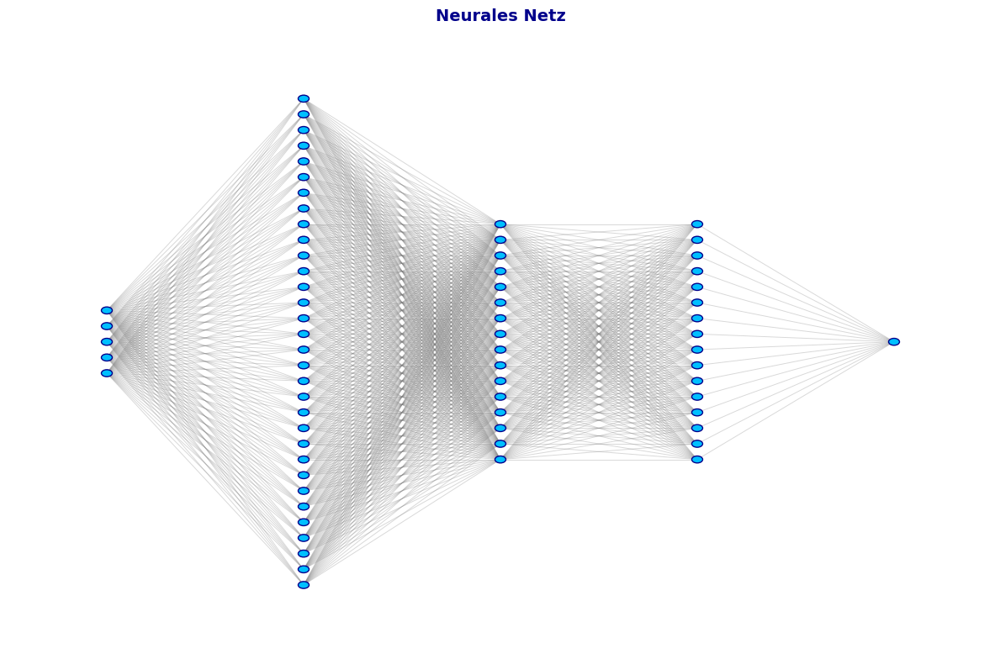

In [ ]:
# Task 9 – Neural Network: clean and centered visualization of the architecture

import matplotlib.pyplot as plt

def draw_clean_neural_net(ax, left, right, bottom, top, layer_sizes):
    '''
    Draws a perfectly symmetric neural network:
    - perfect circles
    - exact vertical alignment
    - evenly spaced neurons
    '''
    v_spacing = (top - bottom) / float(max(layer_sizes))
    h_spacing = (right - left) / float(len(layer_sizes) - 1)

    # Neurons (round, evenly spaced)
    for i, layer_size in enumerate(layer_sizes):
        layer_top = v_spacing * (layer_size - 1) / 2. + (top + bottom) / 2.
        for j in range(layer_size):
            x = left + i * h_spacing
            y = layer_top - j * v_spacing
            circle = plt.Circle((x, y), v_spacing / 4.5, 
                                color='deepskyblue', ec='darkblue', zorder=4)
            ax.add_artist(circle)

    # Connections (lines from center to center)
    for i, (layer_size_a, layer_size_b) in enumerate(zip(layer_sizes[:-1], layer_sizes[1:])):
        layer_a_top = v_spacing * (layer_size_a - 1) / 2. + (top + bottom) / 2.
        layer_b_top = v_spacing * (layer_size_b - 1) / 2. + (top + bottom) / 2.
        for j in range(layer_size_a):
            for k in range(layer_size_b):
                x1 = left + i * h_spacing
                y1 = layer_a_top - j * v_spacing
                x2 = left + (i + 1) * h_spacing
                y2 = layer_b_top - k * v_spacing
                line = plt.Line2D([x1, x2], [y1, y2], c='gray', alpha=0.3, lw=0.7)
                ax.add_artist(line)

# Structure: 5 inputs, 3 hidden layers, 1 output
layer_sizes = [5, 32, 16, 16, 1]

# Prepare the figure
fig = plt.figure(figsize=(12, 8))
ax = fig.gca()
ax.axis('off')
draw_clean_neural_net(ax, .1, .9, .1, .9, layer_sizes)

# Add title
plt.title("Neural Network", fontsize=14, fontweight='bold', color='darkblue')
plt.tight_layout()
plt.show()

# Optional: save the figure
fig.savefig("task9_clean_structure.png", dpi=300)

In [195]:
# Define optimizer and learning rate
optimizer = optim.Adam(model.parameters(), lr=0.00001)

Define a suitable loss function for the existing regression problem (11)

In [ ]:
# Task 11 – Define an appropriate loss function for regression

import torch.nn as nn

# MSELoss measures the average squared error between prediction and target
criterion = nn.MSELoss()

Create the training loop to train the neural network. The training should run 100 epochs (12). Sum the occuring loss within the episode and save it in a list with the name loss_list (13).

In [ ]:
# Task 12 & 13: Train the network for 100 epochs and record the loss

# Training parameters
epochs = 100                     # Number of training iterations
loss_list = []                   # List to store loss per epoch

# Training loop over all epochs
for e in range(epochs):
    loss_item = 0                # Temporary storage for the loss of the current epoch

    for images, labels in iter(trainloader):
        optimizer.zero_grad()                     # Reset gradients
        output = model(images)                    # Forward pass through the network
        loss = criterion(output, labels)          # Compute loss
        loss.backward()                           # Backward pass (backpropagation)
        optimizer.step()                          # Optimization step

        loss_item += loss.item()                  # Accumulate loss

    # Output per epoch
    print(f"Epoch {e+1}/{epochs} – Loss: {loss_item:.4f}")
    loss_list.append(loss_item)                   # Store the epoch loss

c:\Users\SHARIQ\AppData\Local\Programs\Python\Python312\Lib\site-packages\torch\nn\modules\loss.py:535: UserWarning:

Using a target size (torch.Size([64])) that is different to the input size (torch.Size([64, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.

c:\Users\SHARIQ\AppData\Local\Programs\Python\Python312\Lib\site-packages\torch\nn\modules\loss.py:535: UserWarning:

Using a target size (torch.Size([40])) that is different to the input size (torch.Size([40, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.



Epoche 1/100 – Loss: 2.2358
Epoche 2/100 – Loss: 2.1062
Epoche 3/100 – Loss: 1.9918
Epoche 4/100 – Loss: 1.8839
Epoche 5/100 – Loss: 1.7897
Epoche 6/100 – Loss: 1.7016
Epoche 7/100 – Loss: 1.6188
Epoche 8/100 – Loss: 1.5468
Epoche 9/100 – Loss: 1.4792
Epoche 10/100 – Loss: 1.4157
Epoche 11/100 – Loss: 1.3559
Epoche 12/100 – Loss: 1.3045
Epoche 13/100 – Loss: 1.2554
Epoche 14/100 – Loss: 1.2129
Epoche 15/100 – Loss: 1.1736
Epoche 16/100 – Loss: 1.1387
Epoche 17/100 – Loss: 1.1036
Epoche 18/100 – Loss: 1.0735
Epoche 19/100 – Loss: 1.0498
Epoche 20/100 – Loss: 1.0265
Epoche 21/100 – Loss: 1.0038
Epoche 22/100 – Loss: 0.9868
Epoche 23/100 – Loss: 0.9698
Epoche 24/100 – Loss: 0.9552
Epoche 25/100 – Loss: 0.9420
Epoche 26/100 – Loss: 0.9332
Epoche 27/100 – Loss: 0.9218
Epoche 28/100 – Loss: 0.9135
Epoche 29/100 – Loss: 0.9063
Epoche 30/100 – Loss: 0.9016
Epoche 31/100 – Loss: 0.8945
Epoche 32/100 – Loss: 0.8899
Epoche 33/100 – Loss: 0.8881
Epoche 34/100 – Loss: 0.8842
Epoche 35/100 – Loss: 0

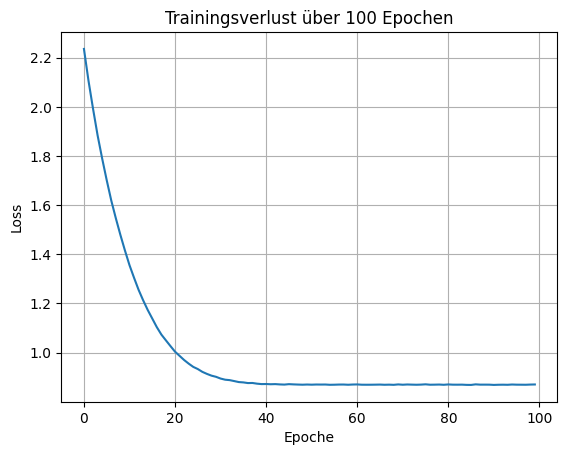

In [ ]:
# Visualization of training loss over the epochs

import matplotlib.pyplot as plt

plt.plot(loss_list)
plt.xlabel('Epoch')                        # x-axis: Epoch
plt.ylabel('Loss')                         # y-axis: Loss
plt.title('Training Loss over 100 Epochs') # Plot title
plt.grid(True)                             # Show grid
plt.show()